In [1]:
%pwd

'/kaggle/working'

In [2]:
system_root = '/kaggle/working'

In [3]:
%cd /kaggle/working

/kaggle/working


In [4]:
%rm -rf /kaggle/working/IndustrialMotionDetection

In [5]:
!git clone -b ruslan-dev https://github.com/CTLab-ITMO/IndustrialMotionDetection.git /kaggle/working/IndustrialMotionDetection

Cloning into '/kaggle/working/IndustrialMotionDetection'...
remote: Enumerating objects: 431, done.
remote: Counting objects: 100% (259/259), done.
remote: Compressing objects: 100% (166/166), done.
remote: Total 431 (delta 127), reused 201 (delta 84), pack-reused 172 (from 1)
Receiving objects: 100% (431/431), 66.15 MiB | 37.40 MiB/s, done.
Resolving deltas: 100% (183/183), done.


In [6]:
%cd /kaggle/working/IndustrialMotionDetection/notebooks

/kaggle/working/IndustrialMotionDetection/notebooks


# Load saved checkpoint

In [7]:
saved_checkpoint_path = f'{system_root}/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-2025.zip'
saved_checkpoint_path

'/kaggle/working/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-2025.zip'

In [8]:
!rm -rf /kaggle/working/runs

In [9]:
!gdown 1pUpWxbYBGhV9OwOcvWOYQYPRZuC4H0RS --output {saved_checkpoint_path}

Downloading...
From (original): https://drive.google.com/uc?id=1pUpWxbYBGhV9OwOcvWOYQYPRZuC4H0RS
From (redirected): https://drive.google.com/uc?id=1pUpWxbYBGhV9OwOcvWOYQYPRZuC4H0RS&confirm=t&uuid=0c738d24-e50c-4f81-9767-c705fe531146
To: /kaggle/working/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-2025.zip
100%|████████████████████████████████████████| 824M/824M [00:14<00:00, 58.2MB/s]


In [10]:
!unzip -o {saved_checkpoint_path} -d {system_root}

Archive:  /kaggle/working/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-2025.zip
   creating: /kaggle/working/runs/
   creating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_2bs_16cliplen-1fsr__2025__1744310938/
  inflating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_2bs_16cliplen-1fsr__2025__1744310938/AL_VideoMAE_MEVA_talksOnPhone_10ep_2bs_16cliplen-1fsr.pth  
  inflating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_2bs_16cliplen-1fsr__2025__1744310938/events.out.tfevents.1744310938.f53e27f5b0eb.1062.0  
   creating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr__2025__1744819743/
  inflating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr__2025__1744819743/events.out.tfevents.1744819743.528d997a4af2.453.0  
  inflating: /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr__2025__1744819743/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr.pth  
   creating: 

# Install libs

In [11]:
%pip install -q --upgrade PyAV
%pip install -q iopath
%pip list | grep "av"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.1/32.1 MB 59.4 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Note: you may need to restart the kernel to use updated packages.
haversine                          2.9.0
pyav                               14.2.1
PyWavelets                         1.8.0
wavio                              0.0.9
Note: you may need to restart the kernel to use updated packages.


# Imports

In [12]:
import sys
import time
import os

os.environ['CUDA_LAUNCH_BLOCKING']= "1"
os.environ['TORCH_USE_CUDA_DSA'] = "1"

import random
import pandas as pd
from pathlib import Path

import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn

from collections import OrderedDict

from tqdm.notebook import tqdm

from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import matplotlib.pyplot as plt
import matplotlib.patches as patches
%matplotlib inline

from functools import partial

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)

add_path(str(Path().cwd().parent.absolute() / "src"))
print(f"{sys.path=}")

from models.dataset import RandomDatasetDecord, collate_fn
from models.model import VisionTransformer
from models.box_list import BoxList

sys.path=['/kaggle/working/IndustrialMotionDetection/src', '/kaggle/working', '/kaggle/lib/kagglegym', '/kaggle/lib', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor', '/root/.ipython']


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.10/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please

# Variables

In [65]:
seed = 2025
torch_deterministic = True

train_ratio = 0.8
test_ratio = 1 - train_ratio

lr = 1e-4
save_frequency = 1
num_epochs = 10

batch_size = 4
clip_len = 16 # NOTE: unchangeable for VideoMAE model
frame_sample_rate = 1

train_epoch_size_ratio = 1.0
val_epoch_size_ratio = 1.0

evaluation_step = 2

exp_name = f"AL_VideoMAE_MEVA_talksOnPhone_{num_epochs}ep_{batch_size}bs_{clip_len}cliplen-{frame_sample_rate}fsr-11i13"

In [14]:
cls = [
    'person_talks_on_phone',
    'person_texts_on_phone',
    'person_interacts_with_laptop',
    'person_reads_document',
    'person_picks_up_object',
]

class_to_idx = {'background': 0}
class_to_idx.update({cl: i+1 for i, cl in enumerate(cls)})
idx_to_class = {v: k for k, v in class_to_idx.items()}
class_to_idx, idx_to_class

({'background': 0,
  'person_talks_on_phone': 1,
  'person_texts_on_phone': 2,
  'person_interacts_with_laptop': 3,
  'person_reads_document': 4,
  'person_picks_up_object': 5},
 {0: 'background',
  1: 'person_talks_on_phone',
  2: 'person_texts_on_phone',
  3: 'person_interacts_with_laptop',
  4: 'person_reads_document',
  5: 'person_picks_up_object'})

In [15]:
num_classes = len(class_to_idx)
num_classes

6

# Check MEVA train and test subsets

In [16]:
!ls -la /kaggle/input 

total 8
drwxr-xr-x 6 root   root    4096 Apr 18 12:34 .
drwxr-xr-x 5 root   root    4096 Apr 18 12:34 ..
drwxr-xr-x 3 nobody nogroup    0 Apr 17 17:52 meva-processed-2018-03-07
drwxr-xr-x 4 nobody nogroup    0 Apr 17 17:52 meva-processed-2018-03-11i13
drwxr-xr-x 3 nobody nogroup    0 Apr 17 17:52 meva-processed-2018-03-15-2
drwxr-xr-x 6 nobody nogroup    0 Apr 17 17:52 meva-processed-2018-03-15i12i05i09


In [66]:
dataset_root = '/kaggle/input/meva-processed-2018-03-11i13'

In [67]:
train_csv_file_path = f'{dataset_root}/train.csv'
val_csv_file_path = f'{dataset_root}/test.csv'

In [19]:
df = pd.read_csv(val_csv_file_path, index_col=['video_path', 'keyframe_id'])
if 'Unnamed: 0' in df.columns:
    df = df.drop(columns=['Unnamed: 0'])
df.head(10)

track_id  \
video_path                                         keyframe_id             
2018-03-15/15/2018-03-15.15-40-00.15-45-00.scho... 0                   1   
                                                   0                   5   
                                                   0                 106   
                                                   1                   1   
                                                   1                   5   
                                                   1                 106   
                                                   2                   1   
                                                   2                   5   
                                                   2                 106   
                                                   3                   1   

                                                                             action_category  \
video_path                                         keyframe_id                                 
2018-03-15/15/2018-03-15.15-40-00.15-45-00.scho... 0            person_interacts_with_laptop   
                                                   0                   person_texts_on_phone   
                                                   0                   person_texts_on_phone   
                                                   1            person_interacts_with_laptop   
                                                   1                   person_texts_on_phone   
                                                   1                   person_texts_on_phone   
                                                   2            person_interacts_with_laptop   
                                                   2                   person_texts_on_phone   
                                                   2                   person_texts_on_phone   
                                                   3            person_interacts_with_laptop   

                                                                xmin  ymin  \
video_path                                         keyframe_id               
2018-03-15/15/2018-03-15.15-40-00.15-45-00.scho... 0             247   276   
                                                   0             404   265   
                                                   0             887   318   
                                                   1             247   276   
                                                   1             404   265   
                                                   1             887   318   
                                                   2             247   276   
                                                   2             404   265   
                                                   2             887   318   
                                                   3             247   276   

                                                                xmax  ymax  
video_path                                         keyframe_id              
2018-03-15/15/2018-03-15.15-40-00.15-45-00.scho... 0             375   452  
                                                   0             513   423  
                                                   0            1033   584  
                                                   1             375   452  
                                                   1             513   423  
                                                   1            1033   584  
                                                   2             375   452  
                                                   2             513   423  
                                                   2            1033   584  
                                                   3             375   452

# Initialize dataset

In [68]:
image_datasets = dict()
image_datasets['train'] = RandomDatasetDecord(
    dataset_root,
    train_csv_file_path,
    class2idx=class_to_idx,
    video_transform='transform',
    epoch_size_ratio=train_epoch_size_ratio,
    frame_sample_rate=frame_sample_rate,
    clip_len=clip_len,
    num_classes=num_classes)
image_datasets['test'] = RandomDatasetDecord(
    data_folder_path=dataset_root,
    csv_file_path=val_csv_file_path,
    class2idx=class_to_idx,
    video_transform='transform',
    epoch_size_ratio=val_epoch_size_ratio,
    frame_sample_rate=frame_sample_rate,
    clip_len=clip_len,
    num_classes=num_classes)

{'person_reads_document': 9.892466978797914, 'person_picks_up_object': 39.29910781793437, 'person_texts_on_phone': 1.2377480163455035, 'person_talks_on_phone': 15.255943645435867}
{'person_texts_on_phone': 1.0848668863627948, 'person_picks_up_object': 29.211365902293117, 'person_reads_document': 59.07056451612903, 'person_talks_on_phone': 36.94703656998739}


In [69]:
len(image_datasets['train']), len(image_datasets['test'])

(249, 61)

In [70]:
for i, x in tqdm(enumerate(image_datasets['train']), total=len(image_datasets['train'])):
    if i == 5: break
    print(x['video'].shape)
    print(x['target'])
    print(x['path'])
    print(x['bbox'])
    print()
    pass

  0%|          | 0/249 [00:00<?, ?it/s]

torch.Size([3, 16, 224, 224])
tensor([[0, 0, 0, 0, 0, 1]])
2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G330_frange8599-8693.avi-48
BoxList(num_boxes=1, image_width=224, image_height=224, mode=xyxy)

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange7742-7826.avi'] keyframe_id=37
boxes=tensor([[1474.,  349., 1572.,  559.],
        [1484.,  339., 1568.,  521.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1]])

torch.Size([3, 16, 224, 224])
tensor([], size=(0, 6), dtype=torch.int64)
2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange7742-7826.avi-37
BoxList(num_boxes=0, image_width=224, image_height=224, mode=xyxy)

torch.Size([3, 16, 224, 224])
tensor([], size=(0, 6), dtype=torch.int64)
2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange2105-2626.avi-268
BoxList(num_boxes=0, image_width=224, image_height=224, mode=xyxy)

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-20-00.17

In [71]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)

g = torch.Generator()
g.manual_seed(seed)

dataloaders = dict()
dataloaders['train'] = DataLoader(
    image_datasets['train'],
    batch_size=batch_size,
    pin_memory=True,
    drop_last=True,
    collate_fn=collate_fn,
    worker_init_fn=seed_worker,
    generator=g)
dataloaders['test'] = DataLoader(
    image_datasets['test'],
    batch_size=batch_size,
    pin_memory=True,
    collate_fn=collate_fn,
    worker_init_fn=seed_worker,
    generator=g)

In [72]:
len(dataloaders['train']), len(dataloaders['test'])

(62, 16)

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1346
boxes=tensor([[ 398.,  452.,  501.,  598.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

batch['path']=['2018-03-13/16/2018-03-13.16-05-05.16-10-05.school.G339_frange391-467.avi-30', '2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange923-999.avi-30', '2018-03-11/11/2018-03-11.11-30-00.11-35-00.bus.G508_frange769-893.avi-59', '2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi-1346']
batch['video'].shape=torch.Size([4, 3, 16, 224, 224])

video.shape=torch.Size([16, 3, 224, 224])
pixel range: -2.1179039478302 - 2.640000104904175

len(batch['bbox'])=4
bbox_coords=[]

len(batch['target'])=4
targets=[]

video.shape=torch.Size([16, 3, 224, 224])
pixel range: -2.1179039478302 - 2.640000104904175

len(batch['bbox'])=4
bbox_coords=[]

len(batch['target'])=4
targets=[]

vid

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-30-00.11-35-00.school.G299_frange7688-7866.avi'] keyframe_id=119
boxes=tensor([[ 648.,  396.,  766.,  615.],
        [1589.,  307., 1654.,  475.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

batch['path']=['2018-03-13/16/2018-03-13.16-05-05.16-10-05.school.G339_frange391-467.avi-30', '2018-03-13/15/2018-03-13.15-50-08.15-55-08.school.G300_frange4808-5033.avi-116', '2018-03-11/17/2018-03-11.17-20-00.17-25-00.school.G330_frange4064-4140.avi-30', '2018-03-11/11/2018-03-11.11-30-00.11-35-00.school.G299_frange7688-7866.avi-119']
batch['video'].shape=torch.Size([4, 3, 16, 224, 224])

video.shape=torch.Size([16, 3, 224, 224])
pixel range: -2.1179039478302 - 2.640000104904175

len(batch['bbox'])=4
bbox_coords=[[175.99685668945312, 178.68540954589844, 199.21353149414062, 214.546875]]

len(batch['target'])=4
targets=[[0, 0, 0, 0, 0, 1]]

video.shape=torch.Size([16, 3, 224, 224])
pixel range: -2.11790394

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1425
boxes=tensor([[ 401.,  458.,  482.,  605.],
        [ 971.,  454., 1061.,  585.],
        [1345.,  409., 1434.,  533.],
        [1249.,  411., 1335.,  534.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=792
boxes=tensor([[ 385.,  438.,  469.,  608.],
        [1157.,  406., 1238.,  534.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

batch['path']=['2018-03-11/17/2018-03-11.17-20-00.17-25-00.school.G330_frange4064-4140.avi-30', '2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi-1425', '2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frang

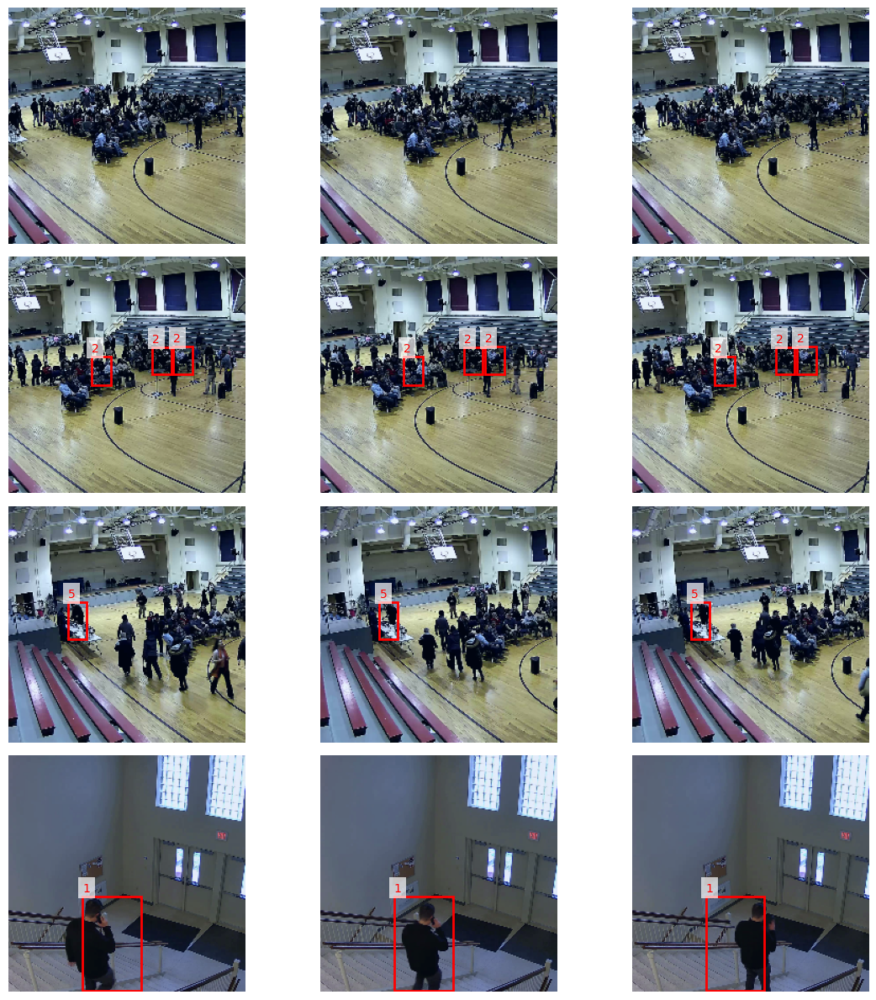

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3976-4098.avi'] keyframe_id=64
boxes=tensor([[1081.,  283., 1213.,  692.],
        [ 893.,  309., 1080.,  787.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-30-00.11-35-00.school.G299_frange7688-7866.avi'] keyframe_id=119
boxes=tensor([[ 648.,  396.,  766.,  615.],
        [1589.,  307., 1654.,  475.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1139
boxes=tensor([[1304.,  384., 1380.,  524.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

batch['path']=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3976-4098.avi-64', '2018-03-13/16/2018-03-13.16-30-00.16-35-00.school.G

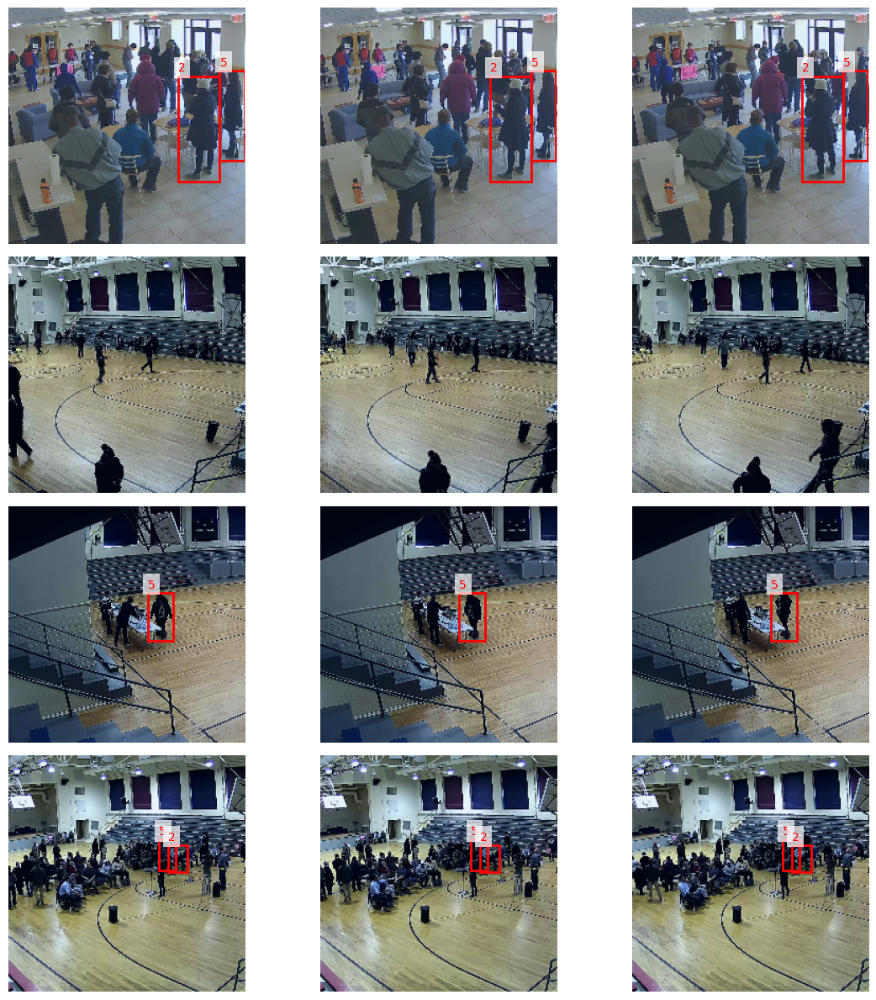

Elapsed: 92.84524607658386


In [73]:
tqdm_progress = tqdm(enumerate(dataloaders['test']), total=len(dataloaders['test']))

count_targets = {k: 0 for k in class_to_idx.keys()}

for i, batch in tqdm_progress:
    if i == 5: break
    
    print(f"{batch['path']=}\n{batch['video'].shape=}\n")
    
    idx2pos = {0: 0, 1: 7, 2: 15}
    
    fig, axes = plt.subplots(batch_size, len(idx2pos), figsize=(12, 12))
    
    for batch_idx in range(batch_size):    
        
        video = batch['video'][batch_idx].permute(1, 0, 2, 3)
        
        bbox_coords = batch['bbox'][batch_idx].bbox.tolist()

        targets = batch['target'][batch_idx].tolist()
        
        print(f"{video.shape=}")
        print(f"pixel range: {video.min()} - {video.max()}\n")
        print(f"{len(batch['bbox'])=}\n{bbox_coords=}\n")
        print(f"{len(batch['target'])=}\n{targets=}\n")
            
        # single batch actions
        for target in targets:
            target_idx = np.argmax(target)
            count_targets[idx_to_class[target_idx]] += 1
        
        for j in range(len(idx2pos)):
            img = video[idx2pos[j]].permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min())

            axes[batch_idx][j].imshow(img)
            axes[batch_idx][j].axis('off')

            for bbox_coord, target in zip(bbox_coords, targets):
                x_min, y_min, x_max, y_max = bbox_coord
                width = x_max - x_min
                height = y_max - y_min
                
                rect = patches.Rectangle(
                    (x_min, y_min), width, height,
                    linewidth=2, edgecolor='red', facecolor='none')
                axes[batch_idx][j].add_patch(rect)
                
                axes[batch_idx][j].text(
                    x_min, y_min - 5, str(np.argmax(target)), 
                    color='red', fontsize=10, 
                    bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

    plt.tight_layout()
    plt.show()

print(f"Elapsed: {tqdm_progress.format_dict['elapsed']}")

In [74]:
import gc
gc.collect()

103085

# Load weights

In [25]:
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = torch_deterministic

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [28]:
finetune = f"{system_root}/checkpoint.pth"

In [ ]:
!gdown '1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww' --output {finetune}

Downloading...
From (original): https://drive.google.com/uc?id=1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww
From (redirected): https://drive.google.com/uc?id=1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww&confirm=t&uuid=b7deb54d-1435-4144-b808-4ac8c0ce2152
To: /kaggle/working/checkpoint.pth
100%|██████████████████████████████████████| 96.2M/96.2M [00:01<00:00, 83.6MB/s]


In [29]:
checkpoint = torch.load(finetune, map_location=device)
checkpoint_model = checkpoint['model']

<ipython-input-29-24a85d9f5fb8>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(finetune, map_location=device)


In [30]:
model = VisionTransformer(
    patch_size=16,
    num_classes=num_classes,
    embed_dim=384,
    depth=12,
    num_heads=6,
    mlp_ratio=4,
    qkv_bias=True,
    drop_rate=0.0,
    drop_path_rate=0.2,
    attn_drop_rate=0.0,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),
    init_scale=0.001,
    all_frames=16,
    tubelet_size=2,
    use_checkpoint=False,
    use_mean_pooling=True)

In [31]:
for name, param in model.named_parameters():
    if (name.startswith('rpn_network')
        or name.startswith('bbox_head')
        or name.startswith('head')
        or name.startswith('roi_heads')):
        continue
    param.requires_grad = False

In [32]:
state_dict = model.state_dict()
state_dict.keys()

odict_keys(['patch_embed.proj.weight', 'patch_embed.proj.bias', 'blocks.0.norm1.weight', 'blocks.0.norm1.bias', 'blocks.0.attn.q_bias', 'blocks.0.attn.v_bias', 'blocks.0.attn.qkv.weight', 'blocks.0.attn.proj.weight', 'blocks.0.attn.proj.bias', 'blocks.0.norm2.weight', 'blocks.0.norm2.bias', 'blocks.0.mlp.fc1.weight', 'blocks.0.mlp.fc1.bias', 'blocks.0.mlp.fc2.weight', 'blocks.0.mlp.fc2.bias', 'blocks.1.norm1.weight', 'blocks.1.norm1.bias', 'blocks.1.attn.q_bias', 'blocks.1.attn.v_bias', 'blocks.1.attn.qkv.weight', 'blocks.1.attn.proj.weight', 'blocks.1.attn.proj.bias', 'blocks.1.norm2.weight', 'blocks.1.norm2.bias', 'blocks.1.mlp.fc1.weight', 'blocks.1.mlp.fc1.bias', 'blocks.1.mlp.fc2.weight', 'blocks.1.mlp.fc2.bias', 'blocks.2.norm1.weight', 'blocks.2.norm1.bias', 'blocks.2.attn.q_bias', 'blocks.2.attn.v_bias', 'blocks.2.attn.qkv.weight', 'blocks.2.attn.proj.weight', 'blocks.2.attn.proj.bias', 'blocks.2.norm2.weight', 'blocks.2.norm2.bias', 'blocks.2.mlp.fc1.weight', 'blocks.2.mlp.fc1

In [33]:
for k in ['head.weight', 'head.bias']:
    if k in checkpoint_model and checkpoint_model[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del checkpoint_model[k]

In [34]:
len(checkpoint_model.keys())

218

In [35]:
all_keys = list(checkpoint_model.keys())
new_dict = OrderedDict()
for key in all_keys:
    if key.startswith('backbone.'):
        new_dict[key[9:]] = checkpoint_model[key]
    elif key.startswith('encoder.'):
        new_dict[key[8:]] = checkpoint_model[key]
    elif (key.startswith('decoder.')
          or key == 'mask_token'
          or key.startswith('encoder_to_decoder')):
        continue
    else:
        new_dict[key] = checkpoint_model[key]

checkpoint_model = new_dict

In [36]:
model.load_state_dict(checkpoint_model, strict=False)

_IncompatibleKeys(missing_keys=['head.weight', 'head.bias', 'rpn_network.head.conv.0.0.weight', 'rpn_network.head.conv.0.0.bias', 'rpn_network.head.cls_logits.weight', 'rpn_network.head.cls_logits.bias', 'rpn_network.head.bbox_pred.weight', 'rpn_network.head.bbox_pred.bias', 'roi_heads.box_head.fc6.weight', 'roi_heads.box_head.fc6.bias', 'roi_heads.box_head.fc7.weight', 'roi_heads.box_head.fc7.bias', 'roi_heads.box_predictor.cls_score.weight', 'roi_heads.box_predictor.cls_score.bias', 'roi_heads.box_predictor.bbox_pred.weight', 'roi_heads.box_predictor.bbox_pred.bias', 'bbox_head.weight', 'bbox_head.bias'], unexpected_keys=[])

In [37]:
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    # dim = 0 [30, xxx] -> [10, ...], [10, ...], [10, ...] on 3 GPUs
    model = nn.DataParallel(model)
    
model.to(device)

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv3d(3, 384, kernel_size=(2, 16, 16), stride=(2, 16, 16))
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (blocks): ModuleList(
    (0): Block(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=384, out_features=1152, bias=False)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (drop_path): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
    )
    (1): Block(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (at

# Model stats

In [38]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [39]:
count_parameters(model)

21716871

# Metrics

In [40]:
currentPath = f'{system_root}/Object-Detection-Metrics'

In [ ]:
!rm -rf {currentPath}

In [ ]:
!git clone https://github.com/rafaelpadilla/Object-Detection-Metrics.git {currentPath}

Cloning into '/kaggle/working/Object-Detection-Metrics'...
remote: Enumerating objects: 564, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (47/47), done.
remote: Total 564 (delta 32), reused 40 (delta 15), pack-reused 500 (from 1)
Receiving objects: 100% (564/564), 10.64 MiB | 38.76 MiB/s, done.
Resolving deltas: 100% (254/254), done.


In [41]:
libPath = os.path.join(currentPath, 'lib')
add_path(currentPath)
add_path(libPath)

In [42]:
sys.path

['/kaggle/working/Object-Detection-Metrics/lib',
 '/kaggle/working/Object-Detection-Metrics',
 '/kaggle/working/IndustrialMotionDetection/src',
 '/kaggle/working',
 '/kaggle/lib/kagglegym',
 '/kaggle/lib',
 '/usr/lib/python310.zip',
 '/usr/lib/python3.10',
 '/usr/lib/python3.10/lib-dynload',
 '',
 '/usr/local/lib/python3.10/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.10/dist-packages/IPython/extensions',
 '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor',
 '/root/.ipython',
 '/tmp/tmplhziulc7']

In [43]:
from BoundingBox import BoundingBox
from BoundingBoxes import BoundingBoxes
from Evaluator import Evaluator
from utils import BBFormat, CoordinatesType, BBType, MethodAveragePrecision

# Inference Model

In [44]:
with torch.no_grad():
    vid = torch.rand(1, 3, 16, 224, 224).to(device)

    box_list = [BoxList([[0, 0, 5, 5]], (10, 10)).to(device)]
    print(f"{box_list=}")

    labels = [torch.Tensor([[0, 0, 0, 1, 0]]).to(device)]
    print(f"{labels=}")

    detections, lossses = model(vid, box_list, labels)
    print(f"{detections=} {lossses=}")

box_list=[BoxList(num_boxes=1, image_width=10, image_height=10, mode=xyxy)]
labels=[tensor([[0., 0., 0., 1., 0.]], device='cuda:0')]
detections=[] lossses={'loss_objectness': tensor(0.6900, device='cuda:0'), 'loss_rpn_box_reg': tensor(0.0598, device='cuda:0'), 'loss_classifier': tensor(1.9378, device='cuda:0'), 'loss_box_reg': tensor(0.0042, device='cuda:0')}


In [45]:
def print_detections(dct):
    print("Detections example:")
    for item, amount in dct.items():
        print("{} ({})".format(item, amount[:10]))

In [46]:
bi = 0

iouThreshold = .5
showPlot = False
evaluator = Evaluator()

bbFormat = BBFormat.XYWH
coordType = CoordinatesType.Absolute

savePath = os.path.join(system_root, 'results')
os.makedirs(savePath, exist_ok=True)

bboxes_path = os.path.join(savePath, 'bboxes.jpg')

In [47]:
def add_pred_bboxes(
    bboxes,
    scores,
    labels,
    nameOfImage,
    bbFormat,
    coordType,
    allBoundingBoxes,
    imgSize=(0, 0)):
    
    for box, score, label in list(zip(bboxes, scores, labels)):
        x_min, y_min, x_max, y_max = box
        w = x_max - x_min
        h = y_max - y_min
        bb = BoundingBox(
            nameOfImage,
            label,
            x_min, y_min, w, h,
            coordType,
            imgSize,
            BBType.Detected,
            score,
            format=bbFormat)
        allBoundingBoxes.addBoundingBox(bb)
    return allBoundingBoxes

def add_gt_bboxes(
    bboxes,
    labels,
    nameOfImage,
    bbFormat,
    coordType,
    allBoundingBoxes,
    imgSize=(0, 0)):
    
    for j in range(len(bboxes)):
        x_min, y_min, x_max, y_max = bboxes[j]
        label = np.argmax(labels[j])
        w = x_max - x_min
        h = y_max - y_min
        bb = BoundingBox(
            nameOfImage,
            label,
            x_min, y_min, w, h,
            coordType,
            imgSize,
            BBType.GroundTruth,
            format=bbFormat)
        allBoundingBoxes.addBoundingBox(bb)
    return allBoundingBoxes

In [48]:
def compute_metrics_batch_detections(
    detection_results,
    x
):
      allBoundingBoxes = BoundingBoxes()
      allClasses = []

      for j in range(len(detection_results)):
          boxes = detection_results[j]['boxes'].cpu().detach().numpy()
          scores = detection_results[j]['scores'].cpu().detach().numpy()
          labels = detection_results[j]['labels'].cpu().detach().numpy()

          nameOfImage = "/".join(x['path'][j].split('/')[-2:])
          imgSize = tuple(x['video'].shape[-2:])
          # print(f"{nameOfImage=} {imgSize}")

          add_pred_bboxes(boxes, scores, labels,
                          nameOfImage, bbFormat, coordType, allBoundingBoxes, imgSize)

          add_gt_bboxes(x['bbox'][j].bbox.cpu().detach().numpy(),
                        x['target'][j].cpu().detach().numpy(),
                        nameOfImage, bbFormat, coordType, allBoundingBoxes, imgSize)


      # Plot Precision x Recall curve
      detections = evaluator.PlotPrecisionRecallCurve(
          allBoundingBoxes,  # Object containing all bounding boxes (ground truths and detections)
          IOUThreshold=iouThreshold,  # IOU threshold
          method=MethodAveragePrecision.EveryPointInterpolation,
          showAP=True,  # Show Average Precision in the title of the plot
          showInterpolatedPrecision=False,  # Don't plot the interpolated precision curve
          savePath=savePath,
          showGraphic=showPlot)

      return detections

INFO: more then one matches
paths=['2018-03-12/10/2018-03-12.10-25-00.10-30-00.school.G330_frange5398-5729.avi'] keyframe_id=38
boxes=tensor([[ 450.,  649.,  649., 1044.],
        [ 137.,  380.,  195.,  560.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1]])

INFO: more then one matches
paths=['2018-03-15/15/2018-03-15.15-45-00.15-50-00.school.G421_frange0-9000.avi'] keyframe_id=4416
boxes=tensor([[ 244.,  456.,  600., 1071.],
        [ 405.,  261.,  512.,  433.],
        [ 857.,  324., 1046.,  592.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-12/10/2018-03-12.10-25-00.10-30-00.school.G330_frange5878-5968.avi'] keyframe_id=42
boxes=tensor([[352., 562., 478., 777.],
        [352., 562., 478., 777.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1]])

x['video'].shape=torch.Size([4, 3, 16, 224, 224])
len(x['target'])=4 x['target'][0].shape=t

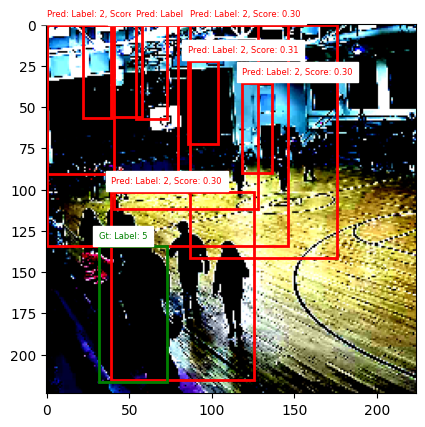

/kaggle/working/Object-Detection-Metrics/lib/Evaluator.py:129: RuntimeWarning: invalid value encountered in divide
  rec = acc_TP / npos


AP: 0.00% (2)
AP: 0.00% (5)
mAP: 0.00%
INFO: more then one matches
paths=['2018-03-05/14/2018-03-05.14-00-00.14-05-00.school.G421_frange6050-6283.avi'] keyframe_id=119
boxes=tensor([[ 349.,  375.,  725., 1071.],
        [ 281.,  294.,  402.,  470.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-15/15/2018-03-15.15-50-00.15-54-59.school.G421_frange0-9001.avi'] keyframe_id=1748
boxes=tensor([[ 770.,  278.,  911.,  541.],
        [ 484.,  232.,  613.,  444.],
        [ 816.,  324., 1050.,  580.],
        [ 409.,  260.,  501.,  442.]]) one_hot_target=tensor([[0, 0, 0, 1, 0, 0],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])



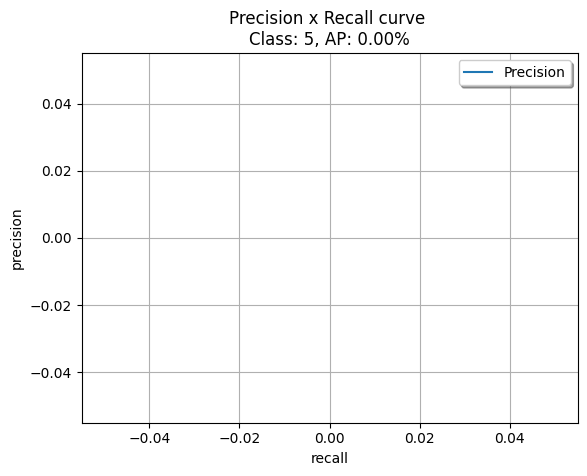

In [49]:
for i, x in enumerate(dataloaders['train']):
    if i == 1: break

    print(f"{x['video'].shape=}") # [b, c, t, h, w]
    print(f"{len(x['target'])=} {x['target'][0].shape=}") # List[b, (n, num_cls)]
    print(f"{len(x['bbox'])=}\n{x['bbox'][bi].bbox.shape=}") # List[b, BoxList[n]]
    print(f"{len(x['path'])=} {x['path'][0]=}")

    batch_size = x['video'].shape[0]

    acc_AP = 0
    validClasses = 0

    model.eval()
    with torch.no_grad():
        detection_results, losses = model(
            x['video'].to(device),
            [b.to(device) for b in x['bbox']],
            [l.to(device) for l in x['target']],
        )
        print_detections(detection_results[bi])
        print(f"\n{lossses=}")

        fig, ax = plt.subplots(1)
        image = x['video'][bi][:, x['video'].shape[2] // 2].permute(1, 2, 0)
        # print(f"\n{image.shape=}")
        ax.imshow(image)

        boxes = detection_results[bi]['boxes'].cpu().detach().numpy()
        scores = detection_results[bi]['scores'].cpu().detach().numpy()
        labels = detection_results[bi]['labels'].cpu().detach().numpy()

        for box, score, label in list(zip(
            boxes, scores, labels))[:10]:
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min

            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            label_text = f"Pred: Label: {label}, Score: {score:.2f}"
            ax.text(x_min, y_min - 5, label_text, color='red', fontsize=6, backgroundcolor='white')

        for bbox_i in range(len(x['bbox'][bi])):
            x_min, y_min, x_max, y_max = x['bbox'][bi].bbox[bbox_i]
            width = x_max - x_min
            height = y_max - y_min

            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=2, edgecolor='g', facecolor='none')
            ax.add_patch(rect)

            label_text = f"Gt: Label: {np.argmax(x['target'][bi][bbox_i])}"
            ax.text(x_min, y_min - 5, label_text, color='green', fontsize=6, backgroundcolor='white')

        plt.show()

        detections = compute_metrics_batch_detections(detection_results, x)

        f = open(os.path.join(savePath, 'results.txt'), 'w')
        f.write('Object Detection Metrics\n')
        f.write('https://github.com/rafaelpadilla/Object-Detection-Metrics\n\n\n')
        f.write('Average Precision (AP), Precision and Recall per class:')

        # each detection is a class
        for metricsPerClass in detections:

            # Get metric values per each class
            cl = metricsPerClass['class']
            ap = metricsPerClass['AP']
            precision = metricsPerClass['precision']
            recall = metricsPerClass['recall']
            totalPositives = metricsPerClass['total positives']
            total_TP = metricsPerClass['total TP']
            total_FP = metricsPerClass['total FP']

            if totalPositives > 0:
                validClasses = validClasses + 1
                acc_AP = acc_AP + ap
                prec = ['%.2f' % p for p in precision]
                rec = ['%.2f' % r for r in recall]
                ap_str = "{0:.2f}%".format(ap * 100)
                # ap_str = "{0:.4f}%".format(ap * 100)
                print('AP: %s (%s)' % (ap_str, cl))
                f.write('\n\nClass: %s' % cl)
                f.write('\nAP: %s' % ap_str)
                f.write('\nPrecision: %s' % prec)
                f.write('\nRecall: %s' % rec)

        mAP = acc_AP / validClasses
        mAP_str = "{0:.2f}%".format(mAP * 100)
        print('mAP: %s' % mAP_str)
        f.write('\n\n\nmAP: %s' % mAP_str)

In [50]:
b = len(detection_results)
print(f"{b=}")
first = detection_results[0]
print(f"{first.keys()=}")
print(f"{first['boxes'].shape=}")
print(f"{first['scores'].shape=}")
print(f"{first['labels'].shape=}")
print(f"{first['labels'].unique()=}")

b=4
first.keys()=dict_keys(['boxes', 'labels', 'scores'])
first['boxes'].shape=torch.Size([100, 4])
first['scores'].shape=torch.Size([100])
first['labels'].shape=torch.Size([100])
first['labels'].unique()=tensor([2, 3, 4, 5], device='cuda:0')


# Train script

In [51]:
def draw_bboxes(video, boxes, scores, labels, top_k=3):
    # video shape - [c, t, h, w]
    # boxes shape - [n, 4]
    # labels and scores shape - [n]

    fig, ax = plt.subplots(1)
    middle_frame_index = video.shape[1] // 2
    # [c, h, w] -> [c, w, h]
    image = video[:, middle_frame_index].permute(1, 2, 0)
    image = (image - image.min()) / (image.max() - image.min())

    ax.imshow(image)

    # print(f"top_k boxes stat:\n{list(zip(boxes, scores, labels))[:top_k]}")

    for box, score, label in list(zip(boxes, scores, labels))[:top_k]:
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min
        height = y_max - y_min

        rect = patches.Rectangle((x_min, y_min), width, height,
                                  linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

        label_text = f"Label: {label}, Score: {score:.2f}"
        ax.text(x_min, y_min - 5, label_text,
                color='red', fontsize=8, backgroundcolor='white')

    plt.savefig(bboxes_path)

In [52]:
def run_epoch(phase, dataloader):
    if phase == 'train':
        model.train()
    else:
        model.eval()

    running_loss = 0.0
    running_mAP = 0.0
    running_AP = {f"AP-{i}": 0.0 for i in range(num_classes)}

    all_elems_count = 0
    batch_count = len(dataloader)

    cur_tqdm = tqdm(dataloader, total=len(dataloader), leave=False)
    for i, batch in enumerate(cur_tqdm):
        acc_AP = 0
        validClasses = 0

        inputs = batch['video'].to(device) # [B, C, T, H, W]
        labels = [l.to(device) for l in batch['target']] # List[B, (N, cls)]
        boxes = [b.to(device) for b in batch['bbox']]
        
        detection_results, losses = model(inputs, boxes, labels)

        bz = inputs.shape[0]
        all_elems_count += bz

        show_dict = {}

        if phase == 'train':
            loss = sum(losses.values())

            if isinstance(loss, int):
                print(f"{inputs.shape[0]=}")
                print(f'{loss=} {losses.values()=}')

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * bz

            show_dict['Loss'] = f'{loss.item():.6f}'
            for k, v in losses.items(): show_dict[k] = v.item()
            cur_tqdm.set_postfix(show_dict)

            # if i % evaluation_step == 0 and i != 0:
            #     test_epoch(dataloaders['test']) # note: after return model in eval mode not train

        elif phase == 'test':
            draw_bboxes(batch['video'][bi],
                        detection_results[bi]['boxes'].cpu().detach().numpy(),
                        detection_results[bi]['scores'].cpu().detach().numpy(),
                        detection_results[bi]['labels'].cpu().detach().numpy())

            detection_metrics = compute_metrics_batch_detections(
                detection_results, batch
            )

            show_dict['bbox_num_per_video'] = sum(r['boxes'].shape[0] for r in detection_results) / bz
            show_dict['labels_in_batch'] = set(np.concatenate(
                [label.cpu().detach().argmax(dim=1).squeeze().numpy()
                 for label in labels],
                axis=None))
            show_dict['pred_labels'] = set(np.concatenate(
                [r['labels'].cpu().detach().numpy()
                 for r in detection_results]))

            for metricsPerClass in detection_metrics:
                cl = metricsPerClass['class']
                ap = metricsPerClass['AP']
                totalPositives = metricsPerClass['total positives']
                total_TP = metricsPerClass['total TP']
                total_FP = metricsPerClass['total FP']

                if totalPositives > 0:
                    validClasses = validClasses + 1
                    acc_AP = acc_AP + ap

                    show_dict[f'AP-{cl}'] = "{0:.2f}%".format(ap * 100)
                    running_AP[f'AP-{cl}'] += ap

                    # show_dict[f'total_TP-{cl}'] = total_TP
                    # show_dict[f'total_FP-{cl}'] = total_FP
                    # show_dict[f'total_Positives-{cl}'] = totalPositives

            if validClasses != 0:
                mAP = acc_AP / validClasses
                show_dict['mAP'] = "{0:.2f}%".format(mAP * 100)
                running_mAP += mAP

            cur_tqdm.set_postfix(show_dict)

    epoch_loss = running_loss / batch_count
    epoch_mAP = running_mAP / batch_count
    epoch_AP = {k: v / batch_count for k, v in running_AP.items()}

    gc.collect()

    return epoch_loss, epoch_mAP, epoch_AP

In [53]:
def test_epoch(dataloader):
    with torch.inference_mode():
        return run_epoch('test', dataloader)

def train_epoch(dataloader):
    return run_epoch('train', dataloader)

In [54]:
def plot_losses_and_metrics(losses, mAPs):
    # Create a figure with two subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plot Loss
    ax1.plot(losses, label='Training Loss', color='red', marker='o')
    ax1.set_title('Training Loss Over Epochs')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.legend()
    ax1.grid(True)

    # Plot mAP
    ax2.plot(mAPs, label='mAP Score', color='blue', marker='s')
    ax2.set_title('mAP Over Epochs')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('mAP')
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

In [55]:
def train_model(dataloaders, writer=None, num_epochs=5):
    print(f"Training model with params:")
    print(f"Optim: {optimizer}")
    print(f"Criterion: {criterion}")

    phases = ['train', 'test']
    for phase in dataloaders:
        if phase not in phases:
            phases.append(phase)
            
    losses = []
    mAPs = []

    for epoch in tqdm(range(start_epoch, num_epochs + 1)):
        for phase in phases:

            epoch_loss, epoch_mAP, epoch_AP = train_epoch(dataloaders[phase]) if phase == 'train' \
                    else test_epoch(dataloaders[phase])

            if writer:
                if phase == 'train':
                    losses.append(epoch_loss)
                    writer.add_scalar(f'loss/{phase}', epoch_loss, epoch)

                elif phase == 'test':
                    mAPs.append(epoch_mAP)
                    writer.add_scalar(f'mAP/{phase}', epoch_mAP, epoch)

                    precision_recall_curves = {
                        f'images/{i}-curve': os.path.join(savePath, f'{i}.png')
                        for i in range(5)
                    }

                    image_paths = {
                        'images/bboxes': bboxes_path,
                        **precision_recall_curves
                    }

                    for k, path in image_paths.items():
                        if os.path.exists(path):
                            writer.add_image(k, plt.imread(path)[:, :, :3], epoch, dataformats='HWC')

                    for k, v in epoch_AP.items():
                        writer.add_scalar(f'{k}/{phase}', v, epoch)
        
        plot_losses_and_metrics(losses, mAPs)

        if epoch % save_frequency == 0:
            model_path = f"{system_root}/runs/{run_name}/{exp_name}.pth"
            print(f"Saving model at {model_path}")
            torch.save({'epoch': epoch,
                        'model': model.state_dict()}, model_path)

            repo_name = f"{exp_name}-{seed}"
            os.system(f"zip -r {system_root}/{repo_name}.zip runs")
            # os.system(f"cp {repo_name}.zip /content/drive/MyDrive/data")

# Train model

In [76]:
load_checkpoint = None
# load_checkpoint = f'{system_root}/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr__2025__1744819743/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr.pth'
start_epoch = 0
if load_checkpoint is not None:
    checkpoint = torch.load(load_checkpoint, weights_only=True, map_location=device)
    if isinstance(model, nn.DataParallel):
        model.load_state_dict(
            {f"module.{k}": v for k, v in checkpoint['model'].items()})
    else:
        model.load_state_dict(checkpoint['model'])
    start_epoch = checkpoint['epoch'] + 1

In [77]:
start_epoch

0

In [58]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

In [ ]:
!rm -rf /kaggle/working/runs

In [59]:
!mkdir /kaggle/working/runs

mkdir: cannot create directory ‘/kaggle/working/runs’: File exists


In [60]:
%reload_ext tensorboard
%tensorboard --logdir /kaggle/working/runs

Launching TensorBoard...

In [78]:
run_name = f"{exp_name}__{seed}__{int(time.time())}"
log_dir = f"{system_root}/runs/{run_name}"
writer = SummaryWriter(log_dir=log_dir)

In [79]:
import warnings
warnings.filterwarnings("ignore")

In [80]:
import gc
gc.collect()
# torch.cuda.empty_cache()

0

Training model with params:
Optim: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)
Criterion: CrossEntropyLoss()


  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-13/17/2018-03-13.17-05-00.17-10-00.school.G421_frange6154-9002.avi'] keyframe_id=2226
boxes=tensor([[   4.,  387.,  193.,  960.],
        [ 199.,  310.,  353.,  545.],
        [1111.,  191., 1278.,  518.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-00-00.14-05-00.school.G330_frange3032-9009.avi'] keyframe_id=2581
boxes=tensor([[ 440.,  630.,  561.,  886.],
        [ 440.,  630.,  561.,  886.],
        [1324.,  403., 1391.,  576.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange4687-6854.avi'] keyframe_id=1660
boxes=tensor([[1628.,  518., 1727.,  748.],
        [1704.,  533., 1806.,  836.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=2142
boxes=tensor([[ 392.,  462.,  475.,  607.],
        [ 867.,  453.,  950.,  587.],
        [1248.,  412., 1334.,  535.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

video_path='2018-03-11/14/2018-03-11.13-55-00.14-00-00.school.G330_frange5121-5195.avi' keyframe_id=29
type(video_path)=<class 'str'> type(keyframe_id)=<class 'numpy.int64'>
self.data["video_path"].dtype=dtype('O') self.data["keyframe_id"].dtype=dtype('int64')

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3976-4098.avi'] keyframe_id=64
boxes=tensor([[1081.,  283., 1213.,  692.],
        [ 893.,  309., 1080.,  787.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.a

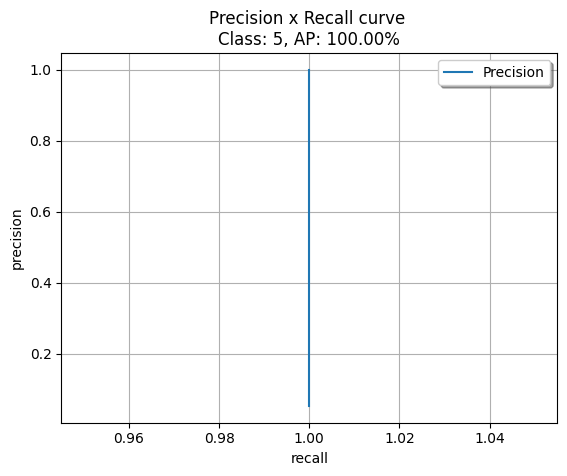

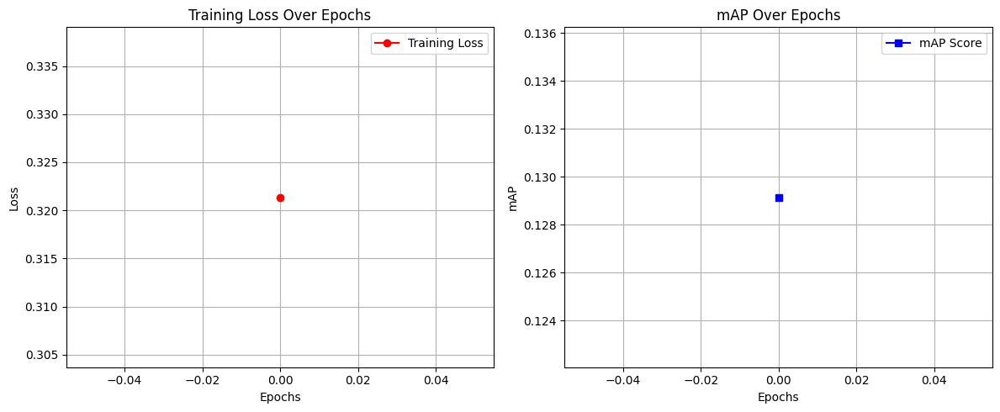

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-20-00.17-25-00.school.G299_frange0-7138.avi'] keyframe_id=6460
boxes=tensor([[1618.,  410., 1706.,  541.],
        [1333.,  297., 1400.,  467.],
        [1724.,  346., 1800.,  522.],
        [1698.,  329., 1770.,  495.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange2256-3729.avi'] keyframe_id=1206
boxes=tensor([[1125.,  409., 1197.,  556.],
        [ 649.,  805.,  902.,  989.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange4237-9007.avi'] keyframe_id=4370
boxes=tensor([[344., 568., 455., 770.],
        [731., 801., 892., 994.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one m

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=8749
boxes=tensor([[1350.,  778., 1562., 1079.],
        [1038.,  418., 1122.,  545.],
        [1249.,  413., 1339.,  540.]]) one_hot_target=tensor([[0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=8609
boxes=tensor([[ 585.,  542.,  672.,  759.],
        [ 869.,  453.,  951.,  583.],
        [1038.,  419., 1122.,  546.],
        [1210.,  417., 1300.,  537.]]) one_hot_target=tensor([[0, 1, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1344
boxes=tensor([[ 396.,  453.,  501.,  599.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0,

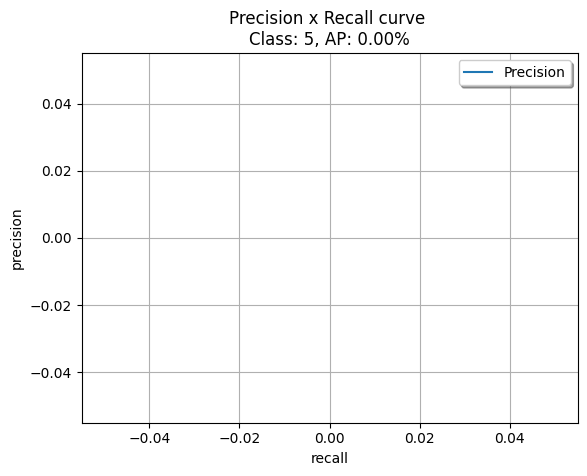

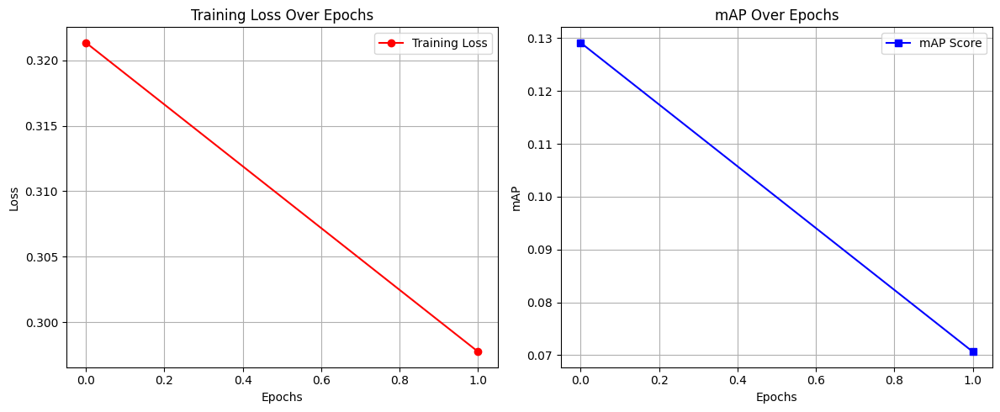

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G330_frange7171-7808.avi'] keyframe_id=48
boxes=tensor([[505., 487., 590., 674.],
        [506., 512., 594., 692.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange0-4493.avi'] keyframe_id=1147
boxes=tensor([[1414.,  382., 1501.,  511.],
        [1044.,  430., 1123.,  628.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange4687-6854.avi'] keyframe_id=1602
boxes=tensor([[1667.,  489., 1755.,  741.],
        [1704.,  533., 1806.,  836.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange0-894.avi'] keyframe_id=848
boxes=tensor([[ 360.,  335.,  

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G299_frange7892-8025.avi'] keyframe_id=84
boxes=tensor([[1842.,  350., 1904.,  513.],
        [1109.,  364., 1229.,  506.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange6362-6482.avi'] keyframe_id=67
boxes=tensor([[445., 470., 515., 627.],
        [848., 443., 923., 609.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1344
boxes=tensor([[ 396.,  453.,  501.,  599.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

video_path='2018-03-13/17/2018-03-13.17-30-00.17-35-00.school.G421_frange1426-1501.avi' keyframe_id=29
type(video_path)=<class 'str'> type(keyframe_id)=<clas

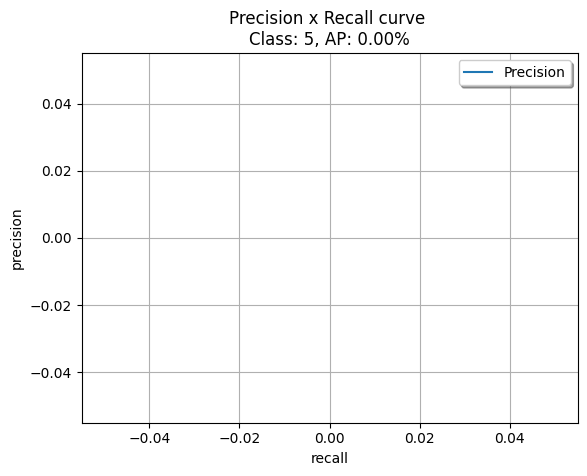

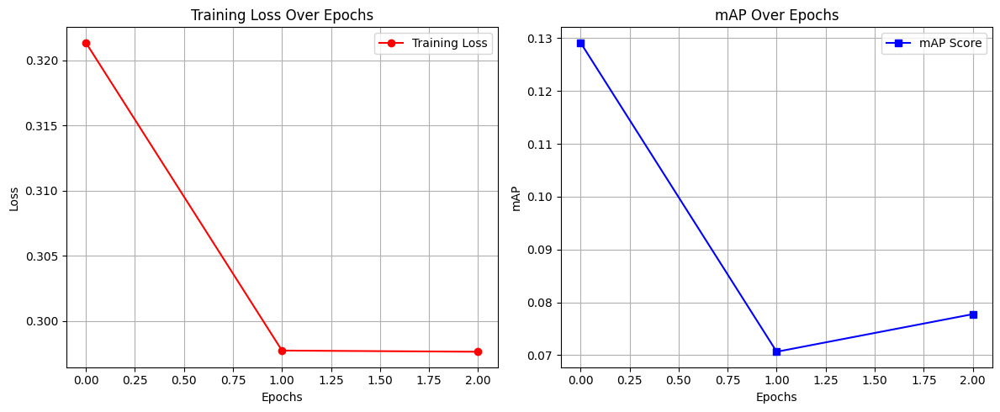

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange2256-3729.avi'] keyframe_id=1291
boxes=tensor([[901., 419., 984., 595.],
        [650., 805., 903., 989.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange0-371.avi'] keyframe_id=57
boxes=tensor([[ 973.,  358., 1057.,  484.],
        [ 725.,  808.,  887.,  971.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange474-1716.avi'] keyframe_id=172
boxes=tensor([[ 969.,  364., 1050.,  497.],
        [ 763.,  829., 1032., 1050.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange4237-9007.avi'] keyframe_id=317
boxes=tensor([[881., 429., 95

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3976-4098.avi'] keyframe_id=64
boxes=tensor([[1081.,  283., 1213.,  692.],
        [ 893.,  309., 1080.,  787.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1425
boxes=tensor([[ 401.,  458.,  482.,  605.],
        [ 971.,  454., 1061.,  585.],
        [1345.,  409., 1434.,  533.],
        [1249.,  411., 1335.,  534.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1492
boxes=tensor([[ 398.,  461.,  487.,  600.],
        [ 972.,  456., 1062.,  588.],
        [1345.,  409., 1434.,  533.],
        [1249.,  411., 1335.,  534.]]) one_hot_target=

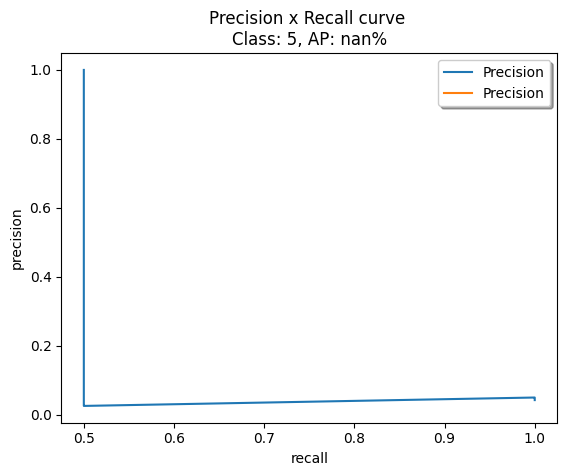

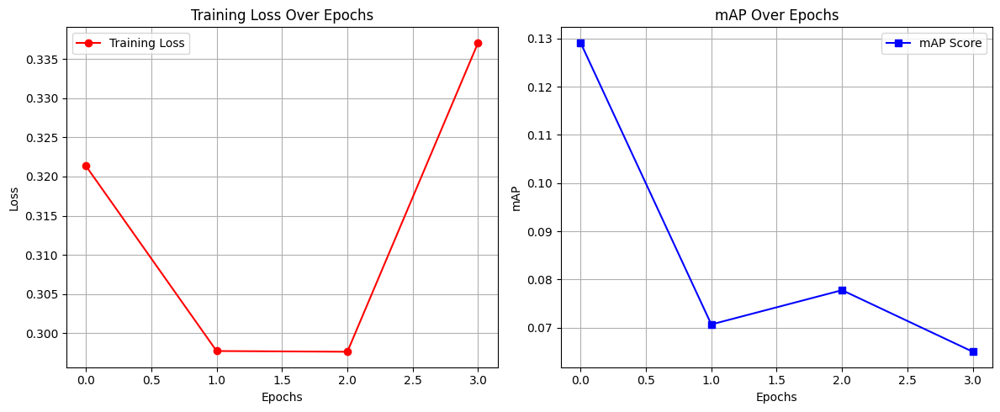

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G299_frange0-7716.avi'] keyframe_id=7117
boxes=tensor([[1486.,  299., 1568.,  469.],
        [1111.,  364., 1231.,  505.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange0-3153.avi'] keyframe_id=1271
boxes=tensor([[1771.,  457., 1857.,  666.],
        [1044.,  640., 1184.,  930.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-20-00.17-25-00.school.G330_frange5090-5514.avi'] keyframe_id=159
boxes=tensor([[480., 504., 564., 700.],
        [738., 474., 821., 595.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange4687-6854.avi'] keyframe_id=1661
boxes=tensor([[1628.,  518.

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=6129
boxes=tensor([[1427.,  417., 1525.,  591.],
        [1087.,  422., 1164.,  554.],
        [1210.,  418., 1300.,  541.],
        [1250.,  411., 1340.,  538.],
        [1531.,  442., 1611.,  644.]]) one_hot_target=tensor([[0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=3636
boxes=tensor([[1571.,  477., 1672.,  654.],
        [ 883.,  411.,  958.,  585.],
        [1094.,  383., 1168.,  557.],
        [1250.,  409., 1340.,  536.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

video_path='2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3316-3391.avi' keyframe_id=29
t

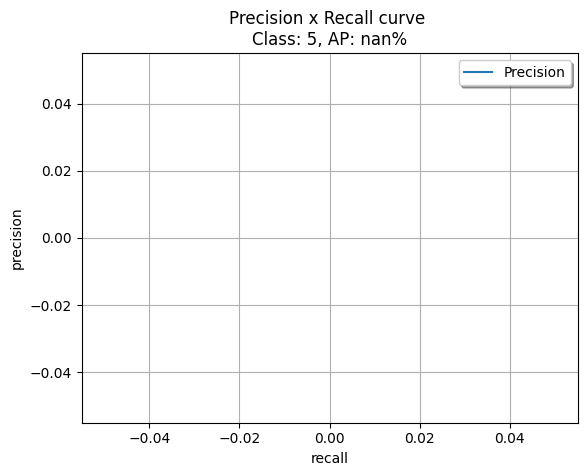

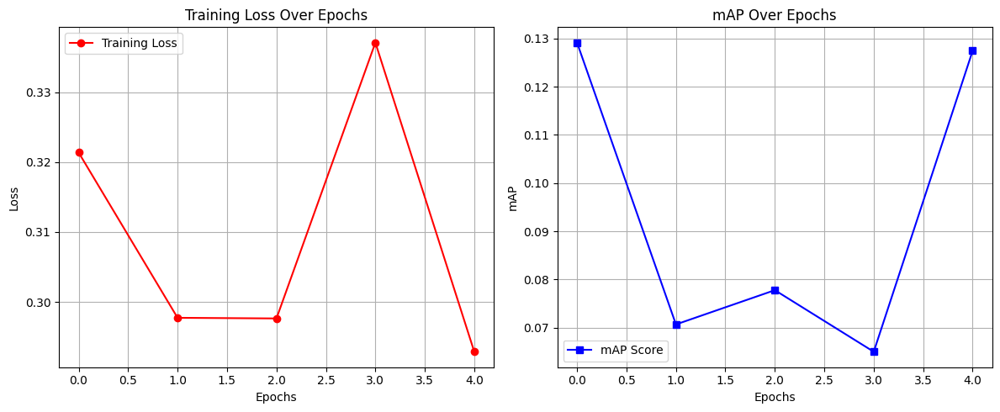

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange4237-9007.avi'] keyframe_id=4369
boxes=tensor([[345., 568., 455., 770.],
        [731., 801., 892., 994.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-20-00.17-25-00.school.G330_frange5090-5514.avi'] keyframe_id=321
boxes=tensor([[470., 505., 559., 701.],
        [736., 475., 820., 595.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange0-4493.avi'] keyframe_id=1038
boxes=tensor([[1332.,  373., 1411.,  518.],
        [1110.,  420., 1185.,  617.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.13-55-00.14-00-00.school.G330_frange2652-4516.avi'] keyframe_id=1605
boxes=tensor([[ 426.,  457.,  50

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=6244
boxes=tensor([[1087.,  422., 1164.,  554.],
        [1207.,  417., 1297.,  540.],
        [1248.,  407., 1341.,  538.]]) one_hot_target=tensor([[0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3976-4098.avi'] keyframe_id=65
boxes=tensor([[1082.,  283., 1214.,  692.],
        [ 892.,  309., 1079.,  787.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

video_path='2018-03-11/13/2018-03-11.13-50-00.13-54-59.school.G330_frange8612-8696.avi' keyframe_id=29
type(video_path)=<class 'str'> type(keyframe_id)=<class 'numpy.int64'>
self.data["video_path"].dtype=dtype('O') self.data["keyframe_id"].dtype=dtype('int64')

video_path='2018-03-11/13/2018-03-11.13-50-00.13-54-59.school.G330_frange8612-8696.avi' keyframe_id=29
ty

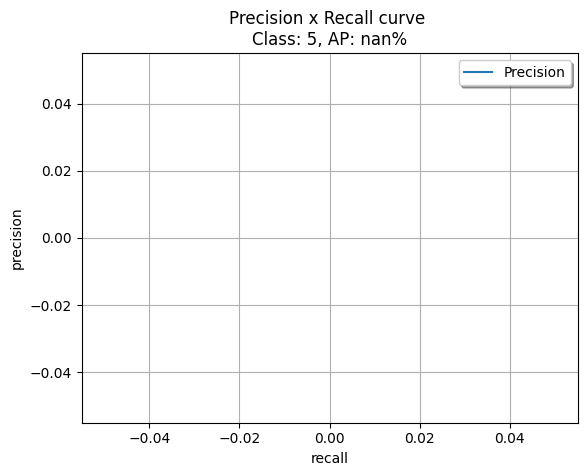

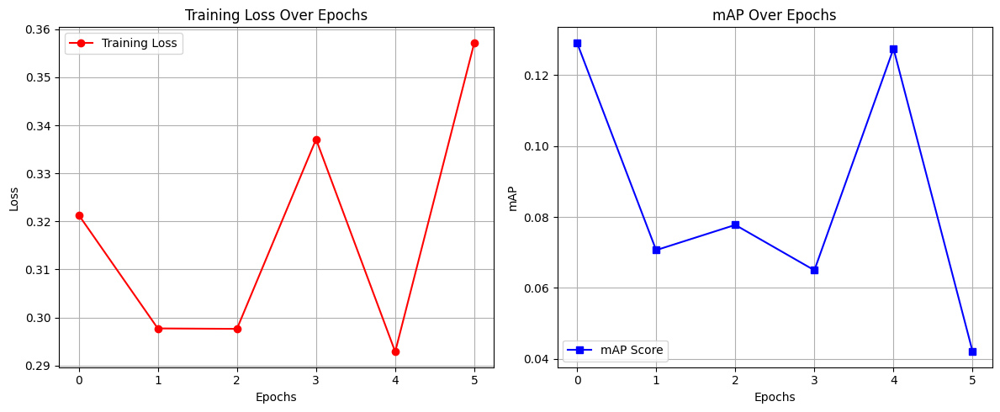

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/12/2018-03-11.11-55-00.12-00-00.bus.G508_frange5772-6873.avi'] keyframe_id=50
boxes=tensor([[172., 364., 270., 611.],
        [172., 364., 270., 611.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 1, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange2256-3729.avi'] keyframe_id=1206
boxes=tensor([[1125.,  409., 1197.,  556.],
        [ 649.,  805.,  902.,  989.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange2256-3729.avi'] keyframe_id=1125
boxes=tensor([[ 971.,  369., 1046.,  549.],
        [ 887.,  412.,  974.,  592.],
        [ 649.,  805.,  902.,  989.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G29

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1345
boxes=tensor([[ 397.,  452.,  501.,  598.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1423
boxes=tensor([[ 400.,  458.,  482.,  606.],
        [ 971.,  454., 1061.,  585.],
        [1345.,  409., 1434.,  533.],
        [1249.,  411., 1335.,  534.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=7585
boxes=tensor([[ 492.,  477.,  578.,  666.],
        [ 864.,  450.,  946.,  591.],
        [1063.,  380., 1140.,  550.],
        [1249.,  410., 1344.,  540.],
        [1530.,  

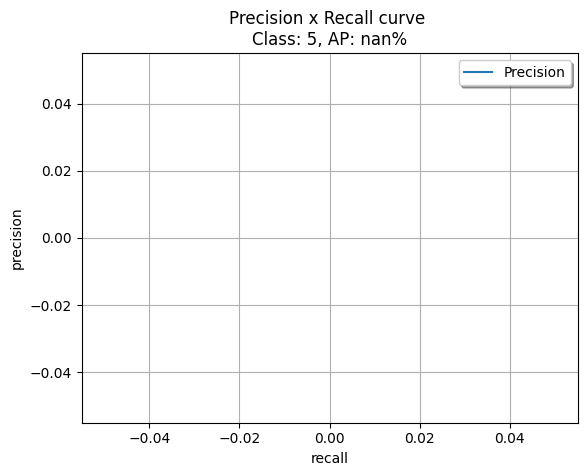

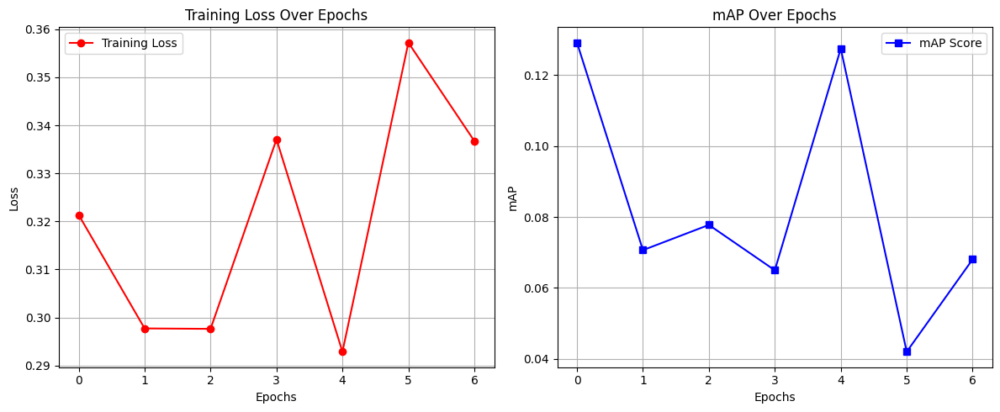

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.13-55-00.14-00-00.school.G299_frange1303-9008.avi'] keyframe_id=6129
boxes=tensor([[1540.,  403., 1643.,  547.],
        [1342.,  378., 1439.,  523.],
        [1559.,  367., 1661.,  516.]]) one_hot_target=tensor([[0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange2256-3729.avi'] keyframe_id=88
boxes=tensor([[745., 366., 816., 532.],
        [642., 805., 904., 989.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange0-4493.avi'] keyframe_id=3954
boxes=tensor([[1043.,  402., 1142.,  595.],
        [ 664.,  861.,  863., 1079.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G33

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=6179
boxes=tensor([[1426.,  415., 1524.,  589.],
        [1087.,  422., 1164.,  554.],
        [1530.,  444., 1610.,  646.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1155
boxes=tensor([[ 471.,  459.,  587.,  669.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=6090
boxes=tensor([[1427.,  417., 1525.,  590.],
        [1087.,  422., 1164.,  554.],
        [1210.,  418., 1300.,  541.],
        [1250.,  411., 1340.,  538.]]) one_hot_target=tensor([[0, 0, 0, 0, 1, 0],
        [0, 0, 1, 0, 0, 0],
        [0,

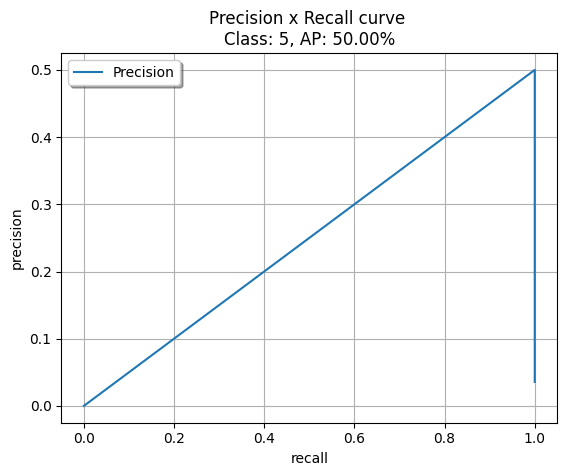

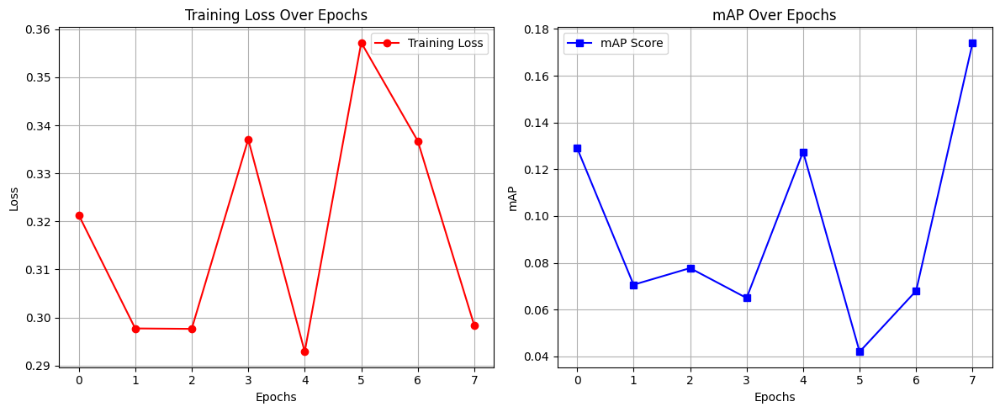

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange0-4493.avi'] keyframe_id=3511
boxes=tensor([[ 483.,  504.,  575.,  680.],
        [1022.,  502., 1119.,  750.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-10-00.14-15-00.school.G299_frange0-7716.avi'] keyframe_id=7218
boxes=tensor([[1367.,  358., 1442.,  522.],
        [1112.,  364., 1232.,  505.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange4168-5373.avi'] keyframe_id=784
boxes=tensor([[ 876.,  306., 1096.,  800.],
        [1094.,  226., 1220.,  590.],
        [ 818.,  143.,  906.,  365.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.scho

  0%|          | 0/16 [00:00<?, ?it/s]

video_path='2018-03-11/13/2018-03-11.13-50-00.13-54-59.school.G330_frange8612-8696.avi' keyframe_id=29
type(video_path)=<class 'str'> type(keyframe_id)=<class 'numpy.int64'>
self.data["video_path"].dtype=dtype('O') self.data["keyframe_id"].dtype=dtype('int64')

video_path='2018-03-13/16/2018-03-13.15-55-00.16-00-00.school.G421_frange3316-3391.avi' keyframe_id=29
type(video_path)=<class 'str'> type(keyframe_id)=<class 'numpy.int64'>
self.data["video_path"].dtype=dtype('O') self.data["keyframe_id"].dtype=dtype('int64')

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=7373
boxes=tensor([[1420.,  412., 1521.,  591.],
        [ 864.,  449.,  946.,  590.],
        [1087.,  422., 1164.,  554.],
        [1248.,  410., 1345.,  540.],
        [1570.,  445., 1641.,  650.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0

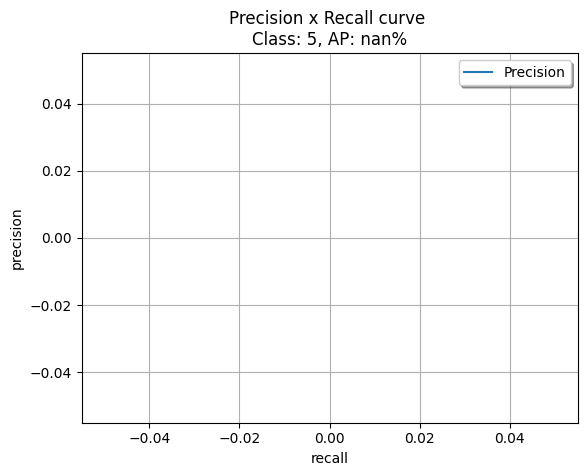

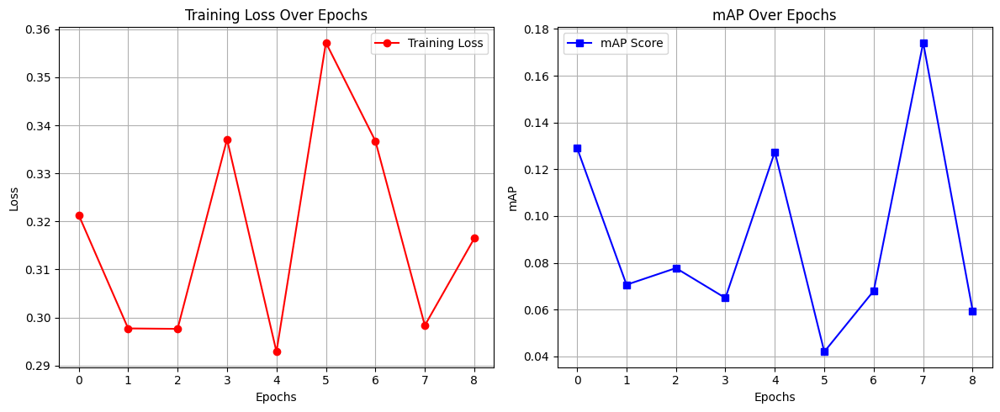

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-13/17/2018-03-13.17-05-00.17-10-00.school.G421_frange1804-4093.avi'] keyframe_id=2218
boxes=tensor([[299., 340., 841., 802.],
        [502., 286., 664., 493.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange3739-4052.avi'] keyframe_id=54
boxes=tensor([[1144.,  412., 1218.,  560.],
        [ 641.,  804.,  902.,  990.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange2105-2626.avi'] keyframe_id=473
boxes=tensor([[1391.,  359., 1457.,  533.],
        [ 369.,  335.,  445.,  493.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange4687-6854.avi'] keyframe_id=1660
boxes=tensor([[1628.,  

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-35-00.16-40-00.school.G299_frange1559-1864.avi'] keyframe_id=256
boxes=tensor([[1585.,  340., 1654.,  523.],
        [1864.,  369., 1919.,  556.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1139
boxes=tensor([[1304.,  384., 1380.,  524.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=791
boxes=tensor([[ 385.,  438.,  469.,  608.],
        [1157.,  406., 1238.,  533.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

video_path='2018-03-11/14/2018-03-11.13-55-00.14-00-00.school.G330_frange5121-5195.a

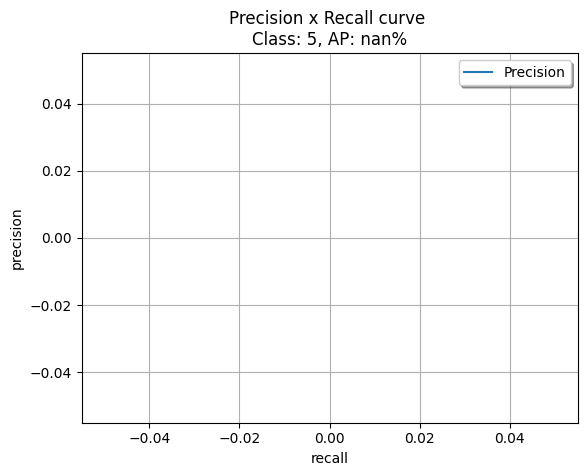

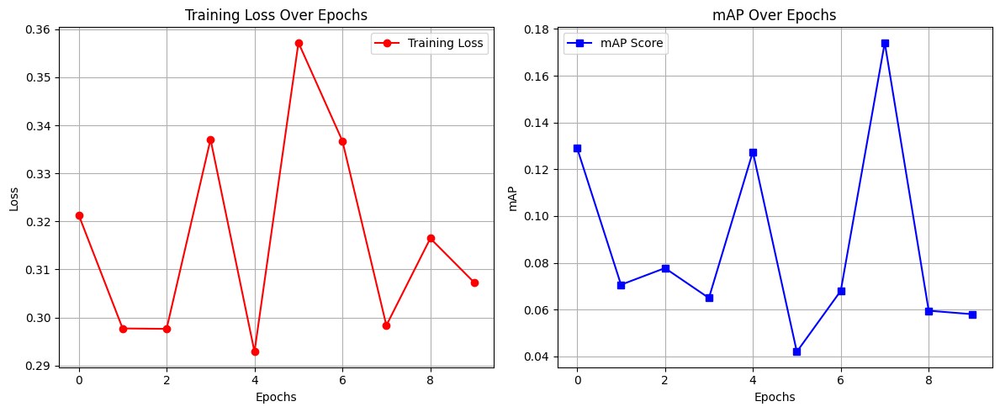

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


  0%|          | 0/62 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/11/2018-03-11.11-50-00.11-55-00.school.G330_frange0-3153.avi'] keyframe_id=1427
boxes=tensor([[1703.,  552., 1831.,  846.],
        [1044.,  641., 1183.,  931.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/16/2018-03-11.16-15-00.16-20-00.school.G330_frange0-371.avi'] keyframe_id=172
boxes=tensor([[722., 808., 887., 974.],
        [722., 808., 887., 974.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-13/17/2018-03-13.17-05-00.17-10-00.school.G421_frange1804-4093.avi'] keyframe_id=2219
boxes=tensor([[300., 340., 838., 802.],
        [502., 286., 664., 493.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/14/2018-03-11.14-15-00.14-19-59.school.G330_frange0-4493.avi'] keyframe_id=2624
boxes=tensor([[1243.,  389., 1315.,  56

  0%|          | 0/16 [00:00<?, ?it/s]

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1344
boxes=tensor([[ 396.,  453.,  501.,  599.],
        [1345.,  409., 1434.,  533.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=1538
boxes=tensor([[ 389.,  439.,  470.,  591.],
        [1345.,  409., 1434.,  533.],
        [1249.,  411., 1335.,  534.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
        [0, 0, 1, 0, 0, 0],
        [0, 0, 1, 0, 0, 0]])

INFO: more then one matches
paths=['2018-03-11/17/2018-03-11.17-15-00.17-20-00.school.G330_frange0-9006.avi'] keyframe_id=7579
boxes=tensor([[ 492.,  477.,  578.,  666.],
        [ 864.,  450.,  946.,  591.],
        [1062.,  381., 1139.,  551.],
        [1249.,  410., 1344.,  540.],
        [1530.,  443., 1605.,  648.]]) one_hot_target=tensor([[0, 0, 0, 0, 0, 1],
 

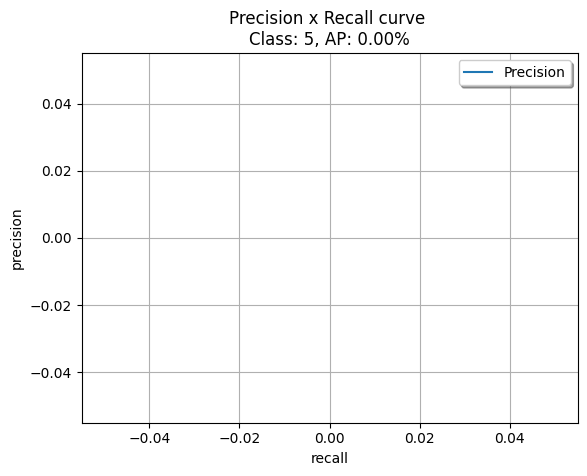

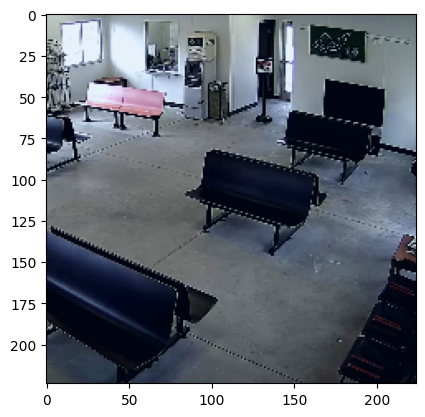

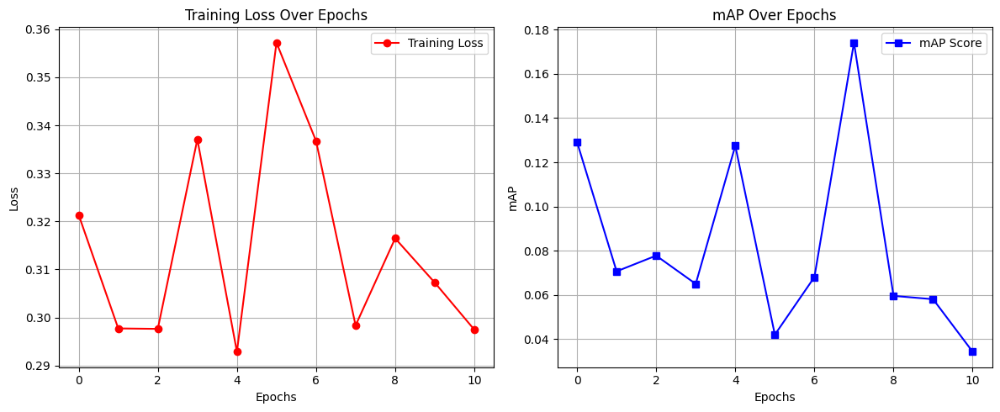

Saving model at /kaggle/working/runs/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13__2025__1744990249/AL_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-1fsr-11i13.pth


In [81]:
train_model(dataloaders, writer, num_epochs)